# PINN-based Seismic Source Localization

<a href="https://colab.research.google.com/github/lucas-j-zheng/2470-final-project/blob/main/2470_v2_12_6.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>


## Setup
install eikonalfm - fast marching method (FMM) solver for eikonal eq, numeric method to solving

- The Eikonal equation models seismic wave travel times: `||∇τ|| = s(x)`, where τ is travel time and s is slowness (1/velocity). This is fundamental to seismic source localization.

In [ ]:
# install eikonalfm fast marching solver
!pip install git+https://github.com/kevinganster/eikonalfm.git

import numpy as np
import matplotlib.pyplot as plt

  Cloning https://github.com/kevinganster/eikonalfm.git to /tmp/pip-req-build-ccvzh741
  Running command git clone --filter=blob:none --quiet https://github.com/kevinganster/eikonalfm.git /tmp/pip-req-build-ccvzh741
  Resolved https://github.com/kevinganster/eikonalfm.git to commit e44a29047c2fb128a6587ee0a9fd5e2af1927d62
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
  Created wheel for eikonalfm: filename=eikonalfm-0.9.8-cp312-cp312-linux_x86_64.whl size=160026 sha256=8413b6fcfd3ef1bff43f2a2ca7cbbd66e9252a7fee8ae011d9462b1d0fa67314
  Stored in directory: /tmp/pip-ephem-wheel-cache-p0c7t489/wheels/65/bb/45/8a6954e1b1c14b981bdb5d2c7451a622d81890481b7b2508d0
Successfully built eikonalfm


In [ ]:
# mount drive to load data
from google.colab import drive
drive.mount('/content/drive')

DATA_PATH = "/content/drive/MyDrive/2070_data/marmousi_Ip_model.npy"

Mounted at /content/drive


## Load Marmousi Velocity Model and Domain

1. Loads the full Marmousi velocity model
2. Downsamples by factor of 20 for computational efficiency
3. Computes slowness field (s = 1/velocity)
4. Randomly places a seismic source within the domain interior
5. Places 20 receivers evenly spaced along the surface (z=0), calculate true times at receivers with eikonal fmm
- `velocity`: downsampled velocity model [nz × nx]
- `slowness`: inverse of velocity, used in Eikonal equation
- `source_x`, `source_z`: normalized source coordinates (ground truth)
- `receiver_x`, `receiver_z`: normalized receiver coordinates

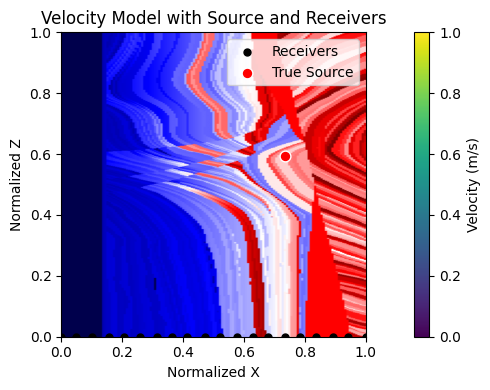

Velocity model shape: (681, 141)
Source location: (0.736, 0.593)


In [ ]:
# load marmousi2 velocity map
full_velocity = np.load(DATA_PATH)[0]

# downsample by taking every 20th coordinate, reduces resolution but is better for training efficiency
velocity = full_velocity[::20, ::20]

# slowness field: s = 1/v (used in Eikonal equation ||∇τ|| = s)
slowness = 1.0 / velocity

# grid / domain size
nz, nx = slowness.shape
x = np.linspace(0, 1, nx)
z = np.linspace(0, 1, nz)

# set seed and constrain random true source to somewhere near the center
np.random.seed(45)
source_x_idx = np.random.randint(int(0.2 * nx), int(0.8 * nx))  # x: 20-80% of domain
source_z_idx = np.random.randint(int(0.4 * nz), int(0.9 * nz))  # z: 40-90% of domain (deeper part of domain)
source_x = x[source_x_idx]
source_z = z[source_z_idx]

# set up 20 receivers at surface (z = 0) to simulate real life scenario
num_receivers = 20
receiver_x_idx = np.linspace(0, nx - 1, num_receivers, dtype=int)
receiver_x = x[receiver_x_idx]
receiver_z = np.zeros_like(receiver_x)  # set z's to be 0

# visualization of domain / problem setup
plt.figure(figsize=(10, 4))
plt.imshow(velocity, extent=[0, 1, 0, 1], origin='lower', cmap='seismic')
plt.scatter(receiver_x, receiver_z, color='black', s=25, label='Receivers')
plt.scatter(source_x, source_z, color='red', label='True Source', edgecolors='white', s=60)
plt.colorbar(label='Velocity (m/s)')
plt.title("Velocity Model with Source and Receivers")
plt.xlabel("Normalized X")
plt.ylabel("Normalized Z")
plt.legend()
plt.tight_layout()
plt.show()

print(f"Velocity model shape: {velocity.shape}")
print(f"Source location: ({source_x:.3f}, {source_z:.3f})")

## Get True Travel Times at Receiver Locations (to simulate them being actual receivers in real life where we know for sure that the traveltime is correct)

1. Computes grid spacing (dz, dx) for the numerical solver
2. Runs the Fast Marching Method to compute travel times from source to all grid points
3. Visualizes the travel time field
4. Extracts travel times at receiver locations as "observed data"

- `tau`: full travel time field [nz × nx]
- `receiver_tts`: travel times at receiver locations (this is our "observed data")

**Note:** This is the forward problem - we know the source and compute travel times. The inverse problem (which PINN solves) is: given travel times, find the source.


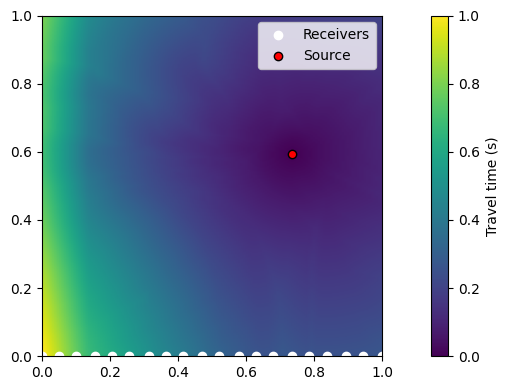

In [ ]:
import eikonalfm

# compute grid spacing in normalized coordinates
# since domain is [0,1] × [0,1], spacing = 1/num_points
dz = 1.0 / velocity.shape[0]
dx = 1.0 / velocity.shape[1]

# solve Eikonal equation using Fast Marching Method, takes in velocity map and true source location, solves travel time
tau = eikonalfm.fast_marching(velocity,
                              (source_z_idx, source_x_idx),
                              (dz, dx),
                              order=2)

# visualization
plt.figure(figsize=(10,4))
plt.imshow(tau, extent=[0,1,0,1], origin='lower', cmap='viridis')
plt.scatter(receiver_x, receiver_z, c='white', label='Receivers')
plt.scatter(source_x, source_z, c='red', label='Source', edgecolors='black')
plt.colorbar(label='Travel time (s)')
plt.legend(); plt.tight_layout(); plt.show()

# get true travel times at receivers
# these are the "observed" arrival times that the PINN will try to fit
receiver_z_idx = 0
receiver_tts = tau[receiver_z_idx, receiver_x_idx] # travel times at each receiver

In [ ]:
import torch
import torch.nn as nn
import torch.autograd as autograd
import torch.nn.functional as F

## PINN Training w/ Adaptive Residual Sampling

1. Fourier Feature Encoding: maps 2D coordinates to higher-dimensional space using random Fourier features to help learn high-frequency functions, necessary to learn high spatial variation of the velocity map
2. Residual-Based Adaptive Sampling: sample collocation training points from areas where physics is violated the most (PDE residual is highest) - done by computing pointwise residuals and sampling from resulting distribution
3. PINN Architecture: 3-layer MLP with Tanh activation, learnable loss weights
4. Training Loop (5000 epochs):
   - Every 100 epochs: Use residual-based sampling for collocation points
   - Other epochs: Random collocation points
   - Computes 3 loss terms: PDE loss, Data loss, Source loss (which takes in src param, our ending predicted source)

Loss Components:
- `loss_pde`: Eikonal equation residual `(||∇τ||² - s²)²` at collocation points
- `loss_data`: MSE between predicted and observed travel times at receivers
- `loss_src`: Physics-based constraint `τ(src_param)² = 0` - travel time at source should be zero

Epoch   500 | PDE 5.15e-08 | Data 1.74e-07 | Src 1.39e-05 | 
    src_param: [0.7772, 0.8570] (dist to true: 0.2675)
Epoch  1000 | PDE 3.13e-08 | Data 7.30e-08 | Src 9.51e-06 | 
    src_param: [0.7693, 0.8484] (dist to true: 0.2580)
Epoch  1500 | PDE 1.93e-08 | Data 3.70e-08 | Src 7.25e-06 | 
    src_param: [0.7617, 0.8409] (dist to true: 0.2496)
Epoch  2000 | PDE 1.30e-08 | Data 2.09e-08 | Src 5.41e-06 | 
    src_param: [0.7539, 0.8328] (dist to true: 0.2408)
Epoch  2500 | PDE 9.29e-09 | Data 1.25e-08 | Src 4.20e-06 | 
    src_param: [0.7459, 0.8250] (dist to true: 0.2326)
Epoch  3000 | PDE 6.78e-09 | Data 7.81e-09 | Src 3.25e-06 | 
    src_param: [0.7377, 0.8173] (dist to true: 0.2247)
Epoch  3500 | PDE 5.07e-09 | Data 4.96e-09 | Src 2.76e-06 | 
    src_param: [0.7313, 0.8105] (dist to true: 0.2179)
Epoch  4000 | PDE 3.92e-09 | Data 3.19e-09 | Src 2.24e-06 | 
    src_param: [0.7245, 0.8036] (dist to true: 0.2113)
Epoch  4500 | PDE 2.90e-09 | Data 2.06e-09 | Src 1.77e-06 | 
    src_par

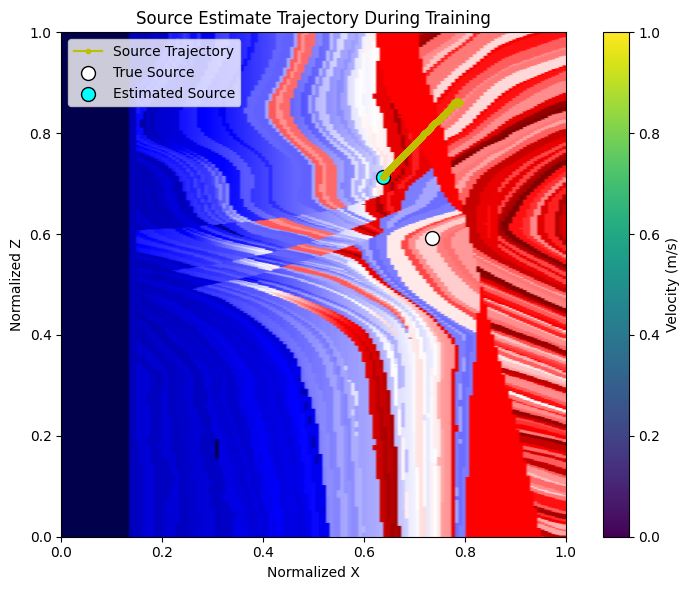

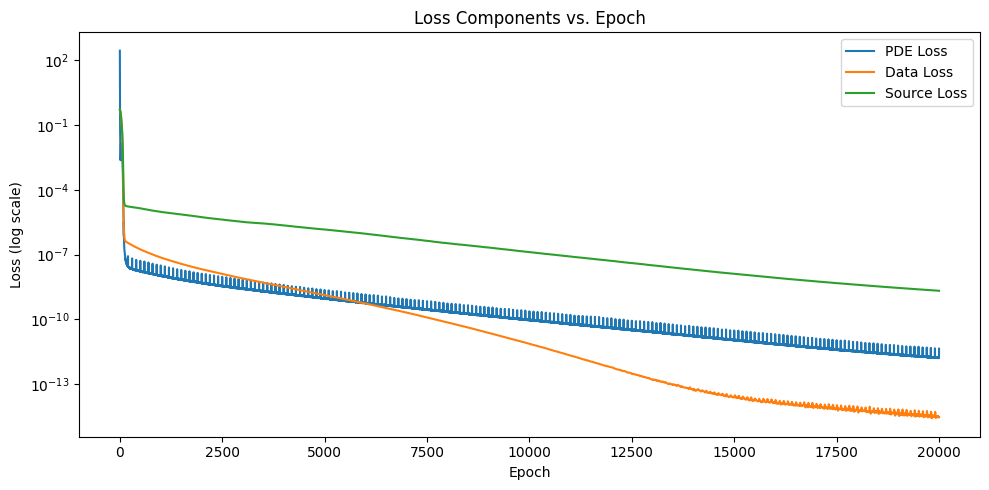

In [ ]:
import numpy as np
import torch
import torch.nn as nn
import torch.autograd as autograd
import matplotlib.pyplot as plt
import torch.nn.functional as F

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

# select random initial source position from the regions determined by true source location
init_src = torch.tensor([
    np.random.uniform(0.2, 0.8),
    np.random.uniform(0.4, 0.9)
], dtype=torch.float32, device=device)
src_param = nn.Parameter(init_src.clone())

# src_param = nn.Parameter(torch.tensor([source_x, source_z], dtype=torch.float32, device=device))
# src_param.requires_grad_(False)

# fourier feature encoding to project input coordinates into higher dimensions,
# https://medium.com/syncedreview/fourier-feature-mapping-enables-mlps-to-learn-high-frequency-functions-in-low-dimensional-domains-3d7ea03fd1a0
class FourierFeature(nn.Module):
  """
  FF encoding - turns 2D input into 512D, which helps the PINN learn
    high frequency data like the marmousi velocity odel
  Input: (x, z) coordinates of shape [batch, 2]
  Output: [sin(2π·x·B), cos(2π·x·B)] of shape [batch, 2*mapping_size]
  """
  def __init__(self, in_dim, mapping_size, scale):
      super().__init__()
      scale = float(scale)
      B = torch.randn(in_dim, mapping_size,
                      dtype=torch.float32,
                      device=device) * scale
      self.register_buffer('B', B)

  def forward(self, x):
      x = x.to(self.B.dtype)
      x_proj = 2 * torch.pi * (x @ self.B)
      return torch.cat([torch.sin(x_proj), torch.cos(x_proj)], dim=-1)

# adaptive residual sampler
# go through domain points, turn points into probability distribution based on how high PDE residual is
# i.e. sample from distribution of points where physics is violated the most
class ResidualSampler:
    """
    Adapative residual sampling, compute pointwise PDE residuals of domain_points,
    sample from resulting probability distribution (with higher physics loss meaning higher prob)
    to get training points
    """
    def __init__(self, domain_points, model, get_slowness, n_samples):
        self.domain      = domain_points    # [M,2], requires_grad=True
        self.model       = model
        self.get_slowness= get_slowness
        self.n           = n_samples

    def sample(self):
        for p in self.model.parameters():
            p.requires_grad_(False)
        tau   = self.model(self.domain)
        grads = autograd.grad(tau.sum(),
                              self.domain,
                              create_graph=False)[0]
        res   = (grads.pow(2).sum(1,True)
                 - self.get_slowness(self.domain).pow(2)).abs().squeeze()

        for p in self.model.parameters():
            p.requires_grad_(True)

        probs = res.detach() / (res.detach().sum() + 1e-8)
        idx   = torch.multinomial(probs, self.n, replacement=True)

        return self.domain.detach()[idx]

# PINN architecture - input coordinates --> Fourier Feature encoding --> 4 layer MLP --> predicted travel time for coordinates
# trainable weights for pde loss and data loss
class PINN(nn.Module):
    """
    The PINN -

    Architecture:
    - Fourier feature input encoding (2 -> 512 dimensions)
    - 3 hidden layers with 256 neurons each, Tanh activation
    - Output: scalar travel time τ(x, z)

    Also includes learnable src_param and learnable loss weights
    """
    def __init__(self):
        super().__init__()
        self.ff  = FourierFeature(in_dim=2, mapping_size=256, scale=10.0)
        self.net = nn.Sequential(
          nn.Linear(256*2, 256), nn.Tanh(),
          nn.Linear(256, 256),   nn.Tanh(),
          nn.Linear(256, 256),   nn.Tanh(),
          nn.Linear(256, 1)
        )
        self.w_pde  = nn.Parameter(torch.tensor(1.0, dtype=torch.float32))
        self.w_data = nn.Parameter(torch.tensor(1.0, dtype=torch.float32))
        self.w_src = nn.Parameter(torch.tensor(1.0, dtype=torch.float32))

    def forward(self, x):
        x = self.ff(x)
        out = self.net(x)
        out = F.softplus(out)
        return out

# scheduled weighting for model.w_src, idea is to make it less important at the beginning since src is likely to be incorrect, allowing model to learn the time field,
# before becoming more important later
def curriculum_weight(epoch, max_epoch, start=0.1, end=1.0):
    return start + (end - start) * min(epoch/max_epoch, 1.0)

# slowness lookup
def get_slowness(xz):
    """
    get slowness values at given (x, z) coordinates,
    uses nearest-neighbor interpolation on the slowness grid
    """
    ix = (xz[:,0] * (nx-1)).round().long().clamp(0,nx-1)
    iz = (xz[:,1] * (nz-1)).round().long().clamp(0,nz-1)
    return slowness_t[iz,ix].unsqueeze(1)

slowness_t = torch.from_numpy(slowness).float().to(device)
rx_t = torch.from_numpy(receiver_x).float().to(device)
rz_t = torch.from_numpy(receiver_z).float().to(device)
rec_coords = torch.stack([rx_t, rz_t], dim=1)
rec_tts_t = torch.from_numpy(receiver_tts).float().to(device)

# define set of candidate points as a pool for collocation points to be sampled from for training
M = 10000
domain = torch.rand(M,2,device=device, requires_grad=True)

# define model and optimizer
model = PINN().to(device)
opt = torch.optim.AdamW([
    {'params': model.net.parameters(), 'lr':1e-3},
    {'params': [model.w_pde, model.w_data], 'lr':5e-4}, # Removed model.w_src from optimizer, it's now scheduled
    {'params': [src_param], 'lr':2e-3}
])

# define sampler, chooses 10000 points per residual sampling to turn into distribution
sampler = ResidualSampler(domain, model, get_slowness, n_samples=10000)

hist_pde, hist_data, hist_src = [], [], []
hist_src_x, hist_src_z = [], []

for epoch in range(1, 20000+1):
    opt.zero_grad()

    # apply curriculum weighting to w_src
    model.w_src.data = torch.tensor(curriculum_weight(epoch, max_epoch=50000, start=0.1, end=1.0), dtype=torch.float32, device=device)

    if epoch % 100 == 0:
        sampled = sampler.sample()
        with torch.no_grad():
            if isinstance(sampled, np.ndarray):
                sampled_pts = torch.from_numpy(sampled)
            else:
                sampled_pts = sampled

        colloc = sampled_pts \
                    .float() \
                    .to(device) \
                    .detach() \
                    .requires_grad_(True)
    else:
        colloc = torch.rand(10000, 2, device=device, requires_grad=True)

    tau_c   = model(colloc)
    grads   = autograd.grad(tau_c.sum(), colloc, create_graph=True)[0]
    loss_pde = ((grads.pow(2).sum(1, True)
                 - get_slowness(colloc).pow(2))**2).mean()

    tau_r = model(rec_coords).squeeze()
    loss_data = (tau_r - rec_tts_t).pow(2).mean()
    tau_s = model(src_param.unsqueeze(0))
    loss_src = (tau_s**2).mean()
    # true_src_t = torch.tensor([source_x, source_z], dtype=torch.float32, device=device)
    # loss_src = ((src_param - true_src_t)**2).sum()


    loss = 100*model.w_pde*loss_pde + 50*model.w_data*loss_data + 0.1*model.w_src*loss_src
    loss.backward()
    torch.nn.utils.clip_grad_norm_(model.parameters(), 1.0)
    torch.nn.utils.clip_grad_norm_([src_param], 1.0)
    opt.step()

    hist_pde.append(loss_pde.item())
    hist_data.append(loss_data.item())
    hist_src.append(loss_src.item())
    hist_src_x.append(src_param[0].item())
    hist_src_z.append(src_param[1].item())
    if epoch%500==0:
        src_np = src_param.detach().cpu().numpy()
        true_src = np.array([source_x, source_z])
        dist = np.linalg.norm(src_np - true_src)
        print(f"Epoch {epoch:5d} | "
              f"PDE {loss_pde.item():.2e} | "
              f"Data {loss_data.item():.2e} | "
              f"Src {loss_src.item():.2e} | ")
        print(f"    src_param: [{src_np[0]:.4f}, {src_np[1]:.4f}] "
              f"(dist to true: {dist:.4f})")

plt.figure(figsize=(8,6))
plt.imshow(velocity, extent=[0,1,0,1], origin='lower', cmap='seismic')
plt.plot(hist_src_x, hist_src_z, 'y.-', label='Source Trajectory')
plt.scatter(source_x, source_z, facecolor='white', edgecolor='k', s=100, label='True Source')
pos_est = src_param.detach().cpu().numpy()
plt.scatter(pos_est[0], pos_est[1], facecolor='cyan', edgecolor='k', s=100, label='Estimated Source')
plt.colorbar(label='Velocity (m/s)')
plt.legend()
plt.title('Source Estimate Trajectory During Training')
plt.xlabel('Normalized X')
plt.ylabel('Normalized Z')
plt.tight_layout()
plt.show()

plt.figure(figsize=(10,5))
plt.semilogy(hist_pde, label='PDE Loss')
plt.semilogy(hist_data, label='Data Loss')
plt.semilogy(hist_src, label='Source Loss')
plt.xlabel('Epoch')

plt.ylabel('Loss (log scale)')
plt.title('Loss Components vs. Epoch')
plt.legend()
plt.tight_layout()
plt.show()

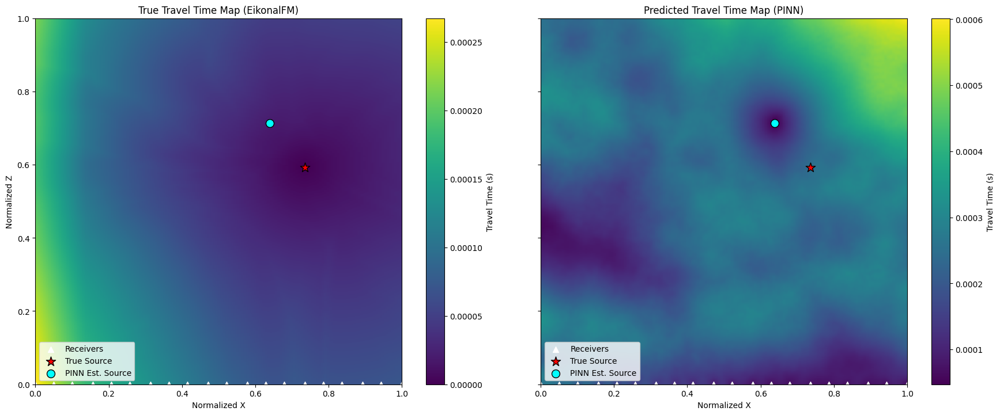

In [ ]:
# visualize traveltime map

# generate a grid of coordinates for prediction
with torch.no_grad():
    plot_nz, plot_nx = slowness.shape # use the original slowness map dimensions for grid
    plot_x = torch.linspace(0, 1, plot_nx, device=device)
    plot_z = torch.linspace(0, 1, plot_nz, device=device)
    plot_X, plot_Z = torch.meshgrid(plot_x, plot_z, indexing='xy')
    plot_coords = torch.stack([plot_X.flatten(), plot_Z.flatten()], dim=1)

    # predicted travel times from the trained model
    predicted_tau_flat = model(plot_coords).cpu().numpy()
    predicted_tau_map = predicted_tau_flat.reshape(plot_nz, plot_nx)

fig, axes = plt.subplots(1, 2, figsize=(18, 7), sharey=True)

# true travel time map from eikonal fm
img_true = axes[0].imshow(tau, extent=[0, 1, 0, 1], origin='lower', cmap='viridis')
axes[0].scatter(receiver_x, receiver_z, c='white', marker='^', s=50, label='Receivers')
axes[0].scatter(source_x, source_z, c='red', marker='*', s=150, edgecolors='black', label='True Source')

# final estimated src position
final_estimated_src = src_param.detach().cpu().numpy()
axes[0].scatter(final_estimated_src[0], final_estimated_src[1], c='cyan', marker='o', s=100, edgecolors='black', label='PINN Est. Source')

axes[0].set_title('True Travel Time Map (EikonalFM)')
axes[0].set_xlabel('Normalized X')
axes[0].set_ylabel('Normalized Z')
axes[0].legend(loc='lower left')
fig.colorbar(img_true, ax=axes[0], label='Travel Time (s)')

# Plot Predicted Travel Time Map (from PINN)
img_pred = axes[1].imshow(predicted_tau_map, extent=[0, 1, 0, 1], origin='lower', cmap='viridis')
axes[1].scatter(receiver_x, receiver_z, c='white', marker='^', s=50, label='Receivers')
axes[1].scatter(source_x, source_z, c='red', marker='*', s=150, edgecolors='black', label='True Source')
axes[1].scatter(final_estimated_src[0], final_estimated_src[1], c='cyan', marker='o', s=100, edgecolors='black', label='PINN Est. Source')

axes[1].set_title('Predicted Travel Time Map (PINN)')
axes[1].set_xlabel('Normalized X')
axes[1].legend(loc='lower left')
fig.colorbar(img_pred, ax=axes[1], label='Travel Time (s)')

plt.tight_layout()
plt.show()

## PINN + RL Sampling

In [ ]:
# RL packages
!pip install gymnasium stable-baselines3 tensorboard

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 188.0/188.0 kB 7.2 MB/s eta 0:00:00


## RL Environment for Adaptive Collocation Point Selection

Instead of random or heuristic sampling, we train an RL agent to select collocation points that maximize PINN training efficiency. The agent learns a policy that maps the current state (PDE residuals, losses) to an action (which collocation point to add).

**Environment Design:**

State Space (403 dimensions):
- Residuals at 400 candidate grid points (20×20 grid)
- Current PDE loss, Data loss, Source loss (3 values)

Action Space:
- Discrete: Select one of 400 candidate points

Reward:
- Loss reduction + penalty for localization error
- `reward = (old_loss - new_loss) - 0.1 * distance_error`

Training Loop:
1. Agent selects a candidate point
2. Point is added to collocation set
3. PINN trains for 5 iterations with combined collocation points
4. Reward is computed based on loss improvement

In [ ]:
import gymnasium as gym
from gymnasium import spaces
import numpy as np
import torch
import torch.nn as nn
import torch.autograd as autograd

# --- PINN and Helper Classes for RL Environment ---

class FourierFeature(nn.Module):
    """
    FF encoding - turns 2D input into 512D, which helps the PINN learn
    high frequency data like the marmousi velocity odel

    Input: (x, z) coordinates of shape [batch, 2]
    Output: [sin(2π·x·B), cos(2π·x·B)] of shape [batch, 2*mapping_size]
    """
    def __init__(self, in_dim, mapping_size, scale):
        super().__init__()
        self.in_dim = in_dim
        self.mapping_size = mapping_size
        self.scale = scale
        # Register B as buffer so it moves with the model to different devices
        self.register_buffer('B', torch.randn(in_dim, mapping_size) * scale)

    def forward(self, x):
        x_proj = 2 * torch.pi * (x @ self.B)
        return torch.cat([torch.sin(x_proj), torch.cos(x_proj)], dim=-1)


class PINN(nn.Module):
    """
    The PINN -

    Architecture:
    - Fourier feature input encoding (2 -> 512 dimensions)
    - 3 hidden layers with 256 neurons each, Tanh activation
    - Output: scalar travel time τ(x, z)

    Also includes learnable src_param and learnable loss weights
    """
    def __init__(self, device):
        super().__init__()
        self.ff = FourierFeature(in_dim=2, mapping_size=256, scale=10.0)
        self.net = nn.Sequential(
            nn.Linear(512, 256), nn.Tanh(),
            nn.Linear(256, 256), nn.Tanh(),
            nn.Linear(256, 256), nn.Tanh(),
            nn.Linear(256, 1)
        )
        # Learnable loss weights initialized on specified device
        self.w_pde = nn.Parameter(torch.tensor(1.0, device=device))
        self.w_data = nn.Parameter(torch.tensor(1.0, device=device))
        self.w_src = nn.Parameter(torch.tensor(1.0, device=device))

    def forward(self, x):
        x = self.ff(x)
        return self.net(x)


# --- Gymnasium Environment Class ---

class PINNCollocationEnv(gym.Env):
    """
    Gymnasium environment for RL-based collocation point selection.

    The agent learns to select which collocation points to add to the
    training set to most efficiently train a PINN for source localization.

    Inputs:
        velocity_model: 2D numpy array of velocity values
        receivers: Receiver coordinates [n_receivers, 2]
        device: 'cpu' or 'cuda'
        fixed_source: Optional (x, z) tuple for fixed true source location
        fixed_traveltimes: Optional pre-computed travel times at receivers
    """

    def __init__(self, velocity_model, receivers, device='cpu',
                 fixed_source=None, fixed_traveltimes=None):
        super().__init__()

        # store velocity model and compute slowness
        self.velocity_map = torch.tensor(velocity_model, dtype=torch.float32, device=device)
        self.slowness_map = 1.0 / (self.velocity_map + 1e-6)  # add epsilon to avoid div by zero
        self.nz, self.nx = velocity_model.shape
        self.device = device

        # grid spacing for eikonalfm
        self.dz = 1.0 / self.nz
        self.dx = 1.0 / self.nx

        # receiver configuration
        self.receivers = torch.tensor(receivers, dtype=torch.float32, device=device)
        self.n_receivers = receivers.shape[0]

        # store fixed source and travel times if provided (for evaluation)
        self.fixed_source = fixed_source
        self.fixed_traveltimes = fixed_traveltimes

        # create fixed grid of candidate collocation points (20x20 = 400 points)
        self.grid_size = 20
        self.n_candidates = self.grid_size * self.grid_size

        x = np.linspace(0, 1, self.grid_size)
        z = np.linspace(0, 1, self.grid_size)
        X, Z = np.meshgrid(x, z)

        # fixed candidate grid - consistent state space for RL
        self.fixed_candidates = torch.tensor(
            np.stack([X.flatten(), Z.flatten()], axis=1),
            dtype=torch.float32,
            device=device
        )

        # define observation space: residuals at candidates + 3 loss values
        # Shape: (400 + 3,) = (403,)
        self.observation_space = spaces.Box(
            low=-np.inf, high=np.inf,
            shape=(self.n_candidates + 3,),
            dtype=np.float32
        )

        # action space: select one of the candidate points
        self.action_space = spaces.Discrete(self.n_candidates)

        # episode state placeholders
        self.model = None
        self.optimizer = None
        self.src_param = None
        self.true_source = None
        self.true_traveltimes = None
        self.candidates = None
        self.collocation_points = None
        self.max_iters = 100

        self.current_step = 0
        self.last_total_loss = 0.0

    def _get_slowness(self, coords):
        """
        get slowness values at given (x, z) coordinates,
        uses nearest-neighbor interpolation on the slowness grid
        """
        ix = (coords[:, 0] * (self.nx - 1)).round().long().clamp(0, self.nx - 1)
        iz = (coords[:, 1] * (self.nz - 1)).round().long().clamp(0, self.nz - 1)
        return self.slowness_map[iz, ix].unsqueeze(1)

    def _compute_residuals(self, points):
        """
        compute PDE residuals at given points without updating gradients for state observation
        """
        if points.shape[0] == 0:
            return torch.tensor([], device=self.device)

        pts = points.clone().detach().requires_grad_(True)
        tau = self.model(pts)
        grads = autograd.grad(tau.sum(), pts, create_graph=False)[0]

        # PDE residual: | ||∇τ||² - s² |
        s = self._get_slowness(pts)
        res = (grads.pow(2).sum(1, keepdim=True) - s.pow(2)).abs()
        return res.detach().squeeze()

    def _get_state(self):
        """
        construct the observation state for the RL agent.
        returns: [residuals at 400 candidates, pde_loss, data_loss, src_loss]
        """
        self.model.eval()

        # compute residuals for all candidate points
        candidate_points_for_grad = self.candidates.detach().clone().requires_grad_(True)
        residuals = self._compute_residuals(candidate_points_for_grad)

        # compute current loss values for state observation
        # PDE Loss
        if self.collocation_points.shape[0] > 0:
            colloc_batch_for_grad = self.collocation_points.detach().clone().requires_grad_(True)
            tau_c_pde = self.model(colloc_batch_for_grad)
            grads_pde = autograd.grad(tau_c_pde.sum(), colloc_batch_for_grad, create_graph=False)[0]
            s_val_pde = self._get_slowness(colloc_batch_for_grad)
            loss_pde_val = ((grads_pde.pow(2).sum(1, keepdim=True) - s_val_pde.pow(2))**2).mean().item()
        else:
            loss_pde_val = 0.0

        # data Loss
        tau_r_data = self.model(self.receivers).squeeze()
        loss_data_val = (tau_r_data - self.true_traveltimes).pow(2).mean().item()

        # source loss
        if self.src_param is not None:
            tau_s_src = self.model(self.src_param.unsqueeze(0))
            loss_src_val = (tau_s_src**2).mean().item()
        else:
            loss_src_val = 0.0

        self.model.train()

        # concatenate into observation vector
        state_obs = np.concatenate([
            residuals.cpu().numpy(),
            np.array([loss_pde_val, loss_data_val, loss_src_val], dtype=np.float32)
        ])
        return state_obs

    def reset(self, seed=None, options=None):
        """
        reset the environment for a new episode.

        if fixed_source and fixed_traveltimes were provided at init, uses those.
        otherwise samples a new random source (for RL training).

        """
        super().reset(seed=seed)

        # explicitly seed numpy and torch for reproducibility across strategies
        if seed is not None:
            np.random.seed(seed)
            torch.manual_seed(seed)
            if torch.cuda.is_available():
                torch.cuda.manual_seed(seed)

        # use fixed source from data if provided, otherwise sample randomly
        if self.fixed_source is not None:
            # use the pre-defined source from the data
            self.true_source = torch.tensor(self.fixed_source, dtype=torch.float32, device=self.device)
            self.true_traveltimes = torch.tensor(self.fixed_traveltimes, dtype=torch.float32, device=self.device)
        else:
            # sample random true source location (for RL training)
            self.true_source_np = np.random.uniform(0.2, 0.8, size=2).astype(np.float32)
            self.true_source = torch.tensor(self.true_source_np, device=self.device)

            # compute ground truth travel times using Fast Marching Method
            src_idx_z = int(self.true_source[1].item() * (self.nz - 1))
            src_idx_x = int(self.true_source[0].item() * (self.nx - 1))

            tau_true_map = eikonalfm.fast_marching(
                self.velocity_map.cpu().numpy(),
                (src_idx_z, src_idx_x),
                (self.dz, self.dx),
                order=2
            )

            rec_grid_z = (self.receivers[:, 1] * (self.nz - 1)).long()
            rec_grid_x = (self.receivers[:, 0] * (self.nx - 1)).long()

            self.true_traveltimes = torch.tensor(
                tau_true_map[rec_grid_z.cpu(), rec_grid_x.cpu()],
                dtype=torch.float32,
                device=self.device
            )

        # initialize fresh PINN model (weights deterministic if seed provided)
        self.model = PINN(self.device).to(self.device)

        # random initial source estimate (deterministic if seed provided)
        init_src_loc = torch.tensor(
            np.random.uniform(0.2, 0.8, size=2),
            dtype=torch.float32, device=self.device
        )
        self.src_param = nn.Parameter(init_src_loc.clone())

        # setup optimizer
        self.optimizer = torch.optim.AdamW([
            {'params': self.model.net.parameters(), 'lr': 1e-3},
            {'params': [self.model.w_pde, self.model.w_data, self.model.w_src], 'lr': 5e-4},
            {'params': [self.src_param], 'lr': 2e-3}
        ])

        # Initialize candidates and collocation points (deterministic if seed provided)
        self.candidates = self.fixed_candidates
        self.collocation_points = torch.rand(100, 2, device=self.device)
        self.current_step = 0
        self.last_total_loss = 1e5

        return self._get_state(), {}

    def step(self, action):
        """
        Execute one step: add selected point and train PINN.

        Input:
            action: Index of candidate point to add

        Returns:
            state, reward, done, truncated, info
        """
        # get the selected candidate point
        selected_point = self.candidates[action].unsqueeze(0)

        # add to collocation set
        self.collocation_points = torch.cat([self.collocation_points, selected_point], dim=0)

        # train PINN for 5 iterations
        for _ in range(5):
            self.optimizer.zero_grad()

            # combine agent-selected points with random background points, balance exploitation and exploration
            background_points = torch.rand(2000, 2, device=self.device)
            combined_colloc = torch.cat([self.collocation_points, background_points], dim=0)
            colloc_batch = combined_colloc.detach().clone().requires_grad_(True)

            # PDE Loss
            tau_c = self.model(colloc_batch)
            grads = autograd.grad(tau_c.sum(), colloc_batch, create_graph=True)[0]
            s_val = self._get_slowness(colloc_batch)
            loss_pde = ((grads.pow(2).sum(1, keepdim=True) - s_val.pow(2))**2).mean()

            # data Loss
            tau_r = self.model(self.receivers).squeeze()
            loss_data = (tau_r - self.true_traveltimes).pow(2).mean()

            # source Loss (τ(source) = 0)
            tau_s = self.model(self.src_param.unsqueeze(0))
            loss_src = (tau_s**2).mean()

            # total loss
            loss = self.model.w_pde * loss_pde + \
                   self.model.w_data * loss_data + \
                   self.model.w_src * loss_src

            loss.backward()
            self.optimizer.step()

            # clamp source to valid domain
            with torch.no_grad():
                self.src_param.clamp_(0.0, 1.0)

        current_total_loss = loss.item()

        # compute reward: loss reduction - localization error penalty
        dist_error = torch.norm(self.src_param - self.true_source).item()
        reward = (self.last_total_loss - current_total_loss) - 0.1 * dist_error

        self.last_total_loss = current_total_loss

        self.candidates = self.fixed_candidates

        # termination conditions
        self.current_step += 1
        done = False
        if current_total_loss < 1e-4 or self.current_step >= self.max_iters:
            done = True

        return self._get_state(), reward, done, False, {"localization_error": dist_error}

## PPO Agent Training

1. Creates a vectorized environment wrapper for stable-baselines3
2. Initializes a PPO agent with MLP policy
3. Trains the agent for 10,000 timesteps
4. Saves the trained model

**Note:** 10,000 timesteps is relatively short for RL training. More timesteps would likely improve performance.

In [ ]:
from stable_baselines3 import PPO
from stable_baselines3.common.vec_env import DummyVecEnv
from stable_baselines3.common.monitor import Monitor
import os

# tensorboard logs
log_dir = "./pinn_rl_logs/"
os.makedirs(log_dir, exist_ok=True)


def make_env():
    """
    Factory function to create wrapped environment.
    Monitor wrapper tracks episode rewards and lengths.
    """
    # detach rec_coords to avoid gradient tracking issues in environment
    receivers_arg = rec_coords.detach() if isinstance(rec_coords, torch.Tensor) else rec_coords
    return Monitor(PINNCollocationEnv(velocity, receivers_arg, device=device), log_dir)


# create vectorized environment
env = DummyVecEnv([make_env])

# initialize PPO agent
# MlpPolicy: Standard fully-connected policy network
# ent_coef=0.01: Entropy coefficient encourages exploration
model = PPO("MlpPolicy", env, verbose=1, learning_rate=3e-4,
            ent_coef=0.01, tensorboard_log=log_dir)

print("Starting RL Training...")
model.learn(total_timesteps=10000) # 10k training steps, probably too small - more better

model.save("pinn_rl_agent")
print("Training Complete.")

Gym has been unmaintained since 2022 and does not support NumPy 2.0 amongst other critical functionality.
Please upgrade to Gymnasium, the maintained drop-in replacement of Gym, or contact the authors of your software and request that they upgrade.
See the migration guide at https://gymnasium.farama.org/introduction/migration_guide/ for additional information.
/tmp/ipython-input-3669525130.py:93: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.detach().clone() or sourceTensor.detach().clone().requires_grad_(True), rather than torch.tensor(sourceTensor).
  self.receivers = torch.tensor(receivers, dtype=torch.float32, device=device)
/usr/local/lib/python3.12/dist-packages/stable_baselines3/common/on_policy_algorithm.py:150: UserWarning: You are trying to run PPO on the GPU, but it is primarily intended to run on the CPU when not using a CNN policy (you are using ActorCriticPolicy which should be a MlpPolicy). See https://github.com/DLR-RM/stable-baseli

Using cuda device
Starting RL Training...
Logging to ./pinn_rl_logs/PPO_1


/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 100      |
|    ep_rew_mean     | 1e+05    |
| time/              |          |
|    fps             | 23       |
|    iterations      | 1        |
|    time_elapsed    | 87       |
|    total_timesteps | 2048     |
---------------------------------
----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 100        |
|    ep_rew_mean          | 1e+05      |
| time/                   |            |
|    fps                  | 23         |
|    iterations           | 2          |
|    time_elapsed         | 177        |
|    total_timesteps      | 4096       |
| train/                  |            |
|    approx_kl            | 0.00689408 |
|    clip_fraction        | 0.0286     |
|    clip_range           | 0.2        |
|    entropy_loss         | -5.99      |
|    explained_variance   | 8.11e-06   |
|    learning_rate        | 0.0003     |
|   

In [ ]:
%load_ext tensorboard

%tensorboard --logdir ./pinn_rl_logs/

<IPython.core.display.Javascript object>

/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)


## Evaluation comparing different samplin strategies

**Strategies**
1. **Random:** Uniformly random point selection (baseline)
2. **Greedy:** Always pick the point with highest residual (deterministic)
3. **Residual Probabilistic / Adapative Resdiual Sampling:** Sample points proportional to residual (stochastic)
4. **RL:** Use the trained PPO agent's policy

**Output:**
- Localization error history over iterations
- Source position trajectory
- PDE loss history

In [ ]:
def run_pinn_optimization(strategy, rl_model=None, steps=100, seed=None):
    """
    Run PINN optimization with a specific collocation point selection strategy.
    Uses the TRUE SOURCE from the data (source_x, source_z) and actual travel times.

    Input:
        strategy: One of 'random', 'greedy', 'residual_prob', 'rl'
        rl_model: Trained RL model (required if strategy='rl')
        steps: Number of optimization steps
        seed: Random seed for reproducibility of PINN initialization

    Returns:
        Tuple of (error_history, true_source, traj_x, traj_z, pde_loss_history)
    """
    # create environment with FIXED source from data (not random)
    receivers_arg = rec_coords.detach().cpu().numpy() if isinstance(rec_coords, torch.Tensor) else rec_coords

    # use the actual source and travel times from the data
    fixed_src = (source_x, source_z)
    fixed_tts = receiver_tts  # get known receiver arrival times

    test_env = PINNCollocationEnv(
        velocity,
        receivers_arg,
        device=device,
        fixed_source=fixed_src,
        fixed_traveltimes=fixed_tts
    )
    state, _ = test_env.reset(seed=seed)

    error_history = []
    src_param_history_x = []
    src_param_history_z = []
    pde_loss_history = []

    print(f"Running evaluation for strategy: {strategy}")
    print(f"  True source: ({source_x:.3f}, {source_z:.3f})")

    for i in range(steps):
        # extract residuals from state
        residuals = state[:-3]

        # ensure non-negative for probability calculation
        residuals = np.maximum(residuals, 0)

        # select action based on strategy
        if strategy == 'random':
            # uniform random selection (baseline)
            action = test_env.action_space.sample()

        elif strategy == 'greedy':
            # always pick max residual point
            action = np.argmax(residuals)

        elif strategy == 'residual_prob':
            # sample proportional to residual
            sum_res = np.sum(residuals)
            if sum_res > 1e-9:
                probs = residuals / sum_res
                action = np.random.choice(len(residuals), p=probs)
            else:
                action = test_env.action_space.sample()

        elif strategy == 'rl':
            # RL policy
            action, _ = rl_model.predict(state, deterministic=True)

        # take a step in env
        state, reward, done, _, info = test_env.step(action)

        error_history.append(info['localization_error'])
        current_src_pos = test_env.src_param.detach().cpu().numpy()
        src_param_history_x.append(current_src_pos[0])
        src_param_history_z.append(current_src_pos[1])
        pde_loss_history.append(state[-3])  # PDE loss is first of 3 loss values

        if done:
            break

    return (error_history,
            test_env.true_source.cpu().numpy(),
            np.array(src_param_history_x),
            np.array(src_param_history_z),
            np.array(pde_loss_history))

## Run Strategy Comparisons

Test out sampling strategies on localization problem

In [ ]:
# --- Run Comparisons ---
steps = 1000  # number of optimization steps per strategy
fixed_eval_seed = 42

# 1. Random baseline
hist_random, true_src_random, traj_x_random, traj_z_random, pde_hist_random = run_pinn_optimization(
    'random', steps=steps, seed=fixed_eval_seed
)

# 2. Greedy (deterministic max residual)
hist_greedy, true_src_greedy, traj_x_greedy, traj_z_greedy, pde_hist_greedy = run_pinn_optimization(
    'greedy', steps=steps, seed=fixed_eval_seed
)

# 3. Residual probabilistic (stochastic, proportional to residual)
hist_res_prob, true_src_prob, traj_x_prob, traj_z_prob, pde_hist_prob = run_pinn_optimization(
    'residual_prob', steps=steps, seed=fixed_eval_seed
)

# 4. RL agent (trained policy)
hist_rl, true_src_rl, traj_x_rl, traj_z_rl, pde_hist_rl = run_pinn_optimization(
    'rl', rl_model=model, steps=steps, seed=fixed_eval_seed
)

Running evaluation for strategy: random
  True source: (0.736, 0.593)
Running evaluation for strategy: greedy
  True source: (0.736, 0.593)
Running evaluation for strategy: residual_prob
  True source: (0.736, 0.593)
Running evaluation for strategy: rl
  True source: (0.736, 0.593)


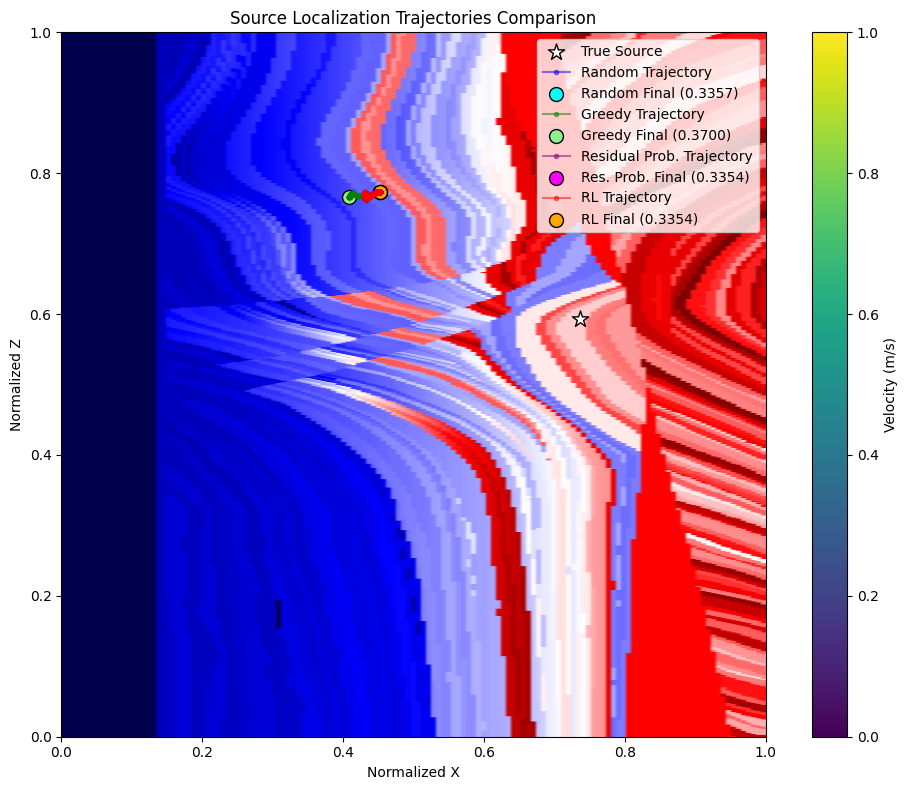

In [ ]:
true_source_for_plot = true_src_random

# final positions
final_pos_random_x, final_pos_random_z = traj_x_random[-1], traj_z_random[-1]
final_pos_greedy_x, final_pos_greedy_z = traj_x_greedy[-1], traj_z_greedy[-1]
final_pos_prob_x, final_pos_prob_z = traj_x_prob[-1], traj_z_prob[-1]
final_pos_rl_x, final_pos_rl_z = traj_x_rl[-1], traj_z_rl[-1]

# --- Plot Trajectories ---
plt.figure(figsize=(10, 8))
plt.imshow(velocity, extent=[0, 1, 0, 1], origin='lower', cmap='seismic')

plt.scatter(true_source_for_plot[0], true_source_for_plot[1],
            facecolor='white', edgecolor='k', s=150, marker='*', label='True Source')

# random strategy (blue)
plt.plot(traj_x_random, traj_z_random, '.-', color='blue', alpha=0.5, label='Random Trajectory')
plt.scatter(final_pos_random_x, final_pos_random_z, facecolor='cyan', edgecolor='k', s=100,
            label=f'Random Final ({hist_random[-1]:.4f})')

# greedy strategy (green)
plt.plot(traj_x_greedy, traj_z_greedy, '.-', color='green', alpha=0.5, label='Greedy Trajectory')
plt.scatter(final_pos_greedy_x, final_pos_greedy_z, facecolor='lightgreen', edgecolor='k', s=100,
            label=f'Greedy Final ({hist_greedy[-1]:.4f})')

# adapative residual sampling (purple)
plt.plot(traj_x_prob, traj_z_prob, '.-', color='purple', alpha=0.5, label='Residual Prob. Trajectory')
plt.scatter(final_pos_prob_x, final_pos_prob_z, facecolor='magenta', edgecolor='k', s=100,
            label=f'Res. Prob. Final ({hist_res_prob[-1]:.4f})')

# RL strategy (red/orange)
plt.plot(traj_x_rl, traj_z_rl, '.-', color='red', alpha=0.5, label='RL Trajectory')
plt.scatter(final_pos_rl_x, final_pos_rl_z, facecolor='orange', edgecolor='k', s=100,
            label=f'RL Final ({hist_rl[-1]:.4f})')

plt.colorbar(label='Velocity (m/s)')
plt.legend()
plt.title('Source Localization Trajectories Comparison')
plt.xlabel('Normalized X')
plt.ylabel('Normalized Z')
plt.tight_layout()
plt.show()

## PDE Loss Convergence Comparison

Compare convergence of PDE loss, since more efficient convergence indicates better learning of the physics

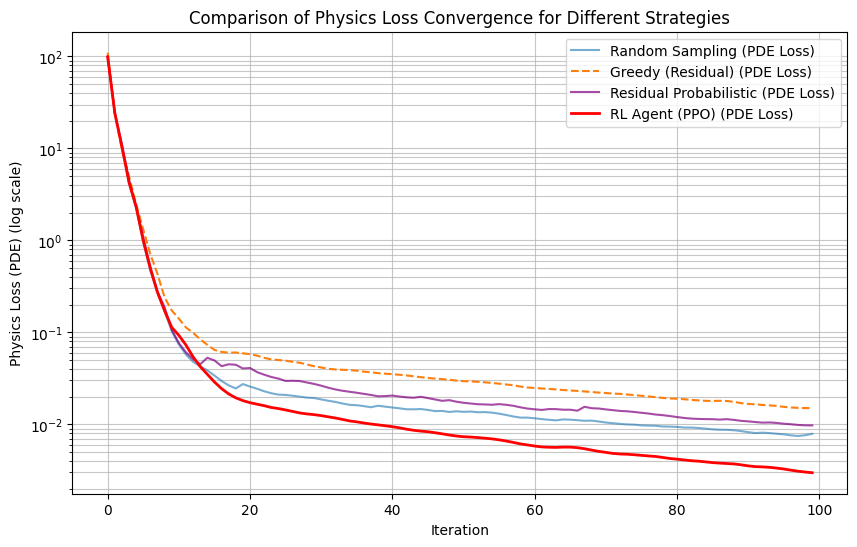

In [ ]:
# --- Plot PDE Loss Convergence ---
plt.figure(figsize=(10, 6))

plt.semilogy(pde_hist_random, label='Random Sampling (PDE Loss)', alpha=0.6)
plt.semilogy(pde_hist_greedy, label='Greedy (Residual) (PDE Loss)', linestyle='--')
plt.semilogy(pde_hist_prob, label='Residual Probabilistic (PDE Loss)', color='purple', alpha=0.7)
plt.semilogy(pde_hist_rl, label='RL Agent (PPO) (PDE Loss)', linewidth=2, color='red')

plt.xlabel('Iteration')
plt.ylabel('Physics Loss (PDE) (log scale)')
plt.title('Comparison of Physics Loss Convergence for Different Strategies')
plt.legend()
plt.grid(True, which="both", ls="-", alpha=0.7)
plt.show()

## Sampling Density Visualization

Visualize where each sampling strat selects collocation points


**Gradient Domination Problem:**
Greedy residual sampling can get "stuck" repeatedly selecting the same high-error regions, neglecting other important areas. This leads to:
- Poor generalization across the domain
- Slower overall convergence
- Missing important physics in under-sampled regions

**Entropy Metric:**
- Higher entropy = more uniform/spread sampling
- Lower entropy = more concentrated/dominated sampling
- Random should have highest entropy, Greedy typically lowest

Using true source from data: (0.736, 0.593)


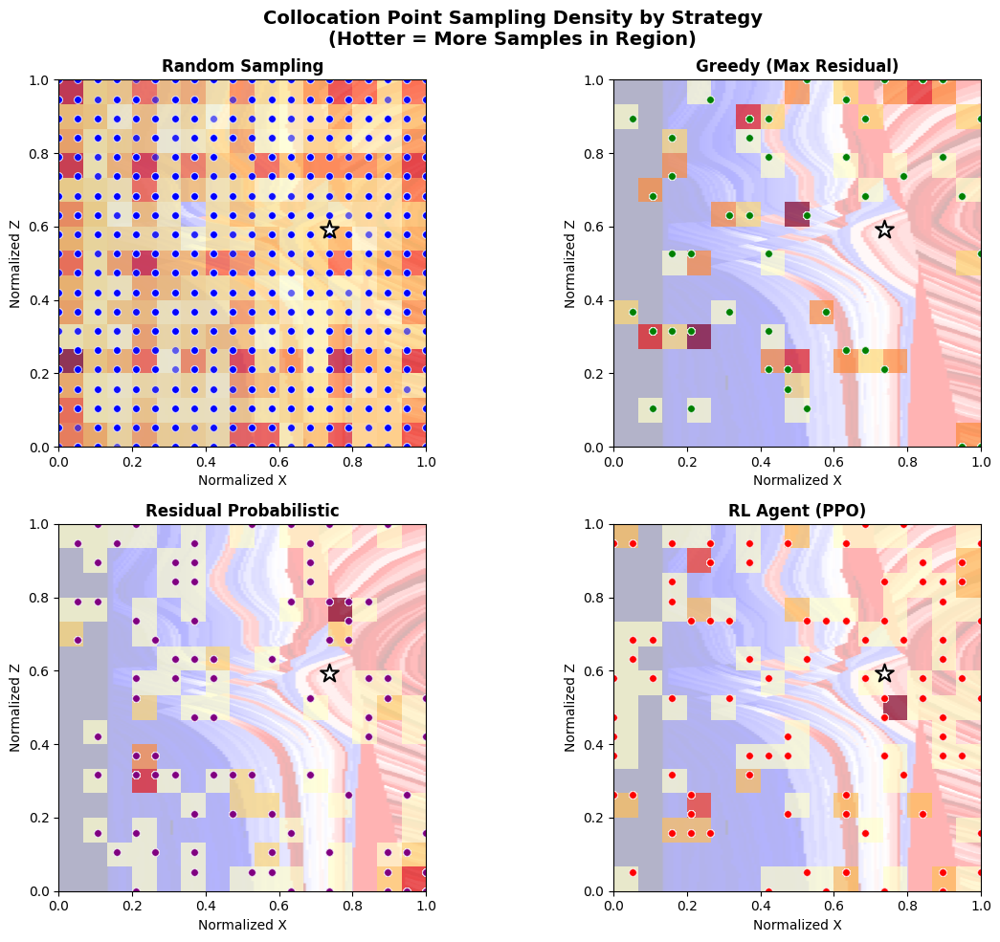


--- Sampling Distribution Entropy ---
(Higher = more spread out, Lower = more concentrated/dominated)
Random:              0.994
Greedy (Residual):   0.749
Residual Prob:       0.854
RL Agent:            0.882


In [ ]:
# visualize how each sampling strat picks points over multiple episodes (i.e. reset and pick points again until we get 2k points)

def visualize_sampling_density(strategy, rl_model=None, steps=2000, seed=42):
    receivers_arg = rec_coords.detach().cpu().numpy() if isinstance(rec_coords, torch.Tensor) else rec_coords

    fixed_src = (source_x, source_z)
    fixed_tts = receiver_tts

    test_env = PINNCollocationEnv(
        velocity,
        receivers_arg,
        device=device,
        fixed_source=fixed_src,
        fixed_traveltimes=fixed_tts
    )

    all_selected_points = []
    np.random.seed(seed)

    while len(all_selected_points) < steps:
        state, _ = test_env.reset(seed=seed)
        for _ in range(test_env.max_iters):
            residuals = state[:-3]
            residuals = np.maximum(residuals, 0)

            if strategy == 'random':
                action = test_env.action_space.sample()
            elif strategy == 'greedy':
                action = np.argmax(residuals)
            elif strategy == 'residual_prob':
                sum_res = np.sum(residuals)
                if sum_res > 1e-9:
                    probs = residuals / sum_res
                    action = np.random.choice(len(residuals), p=probs)
                else:
                    action = test_env.action_space.sample()
            elif strategy == 'rl':
                action, _ = rl_model.predict(state, deterministic=False) # allow for some randomness under RL policy to visualize exploration

            selected_pt = test_env.fixed_candidates[action].cpu().numpy()
            all_selected_points.append(selected_pt)

            state, _, done, _, _ = test_env.step(action)
            if done or len(all_selected_points) >= steps:
                break

    return np.array(all_selected_points)


# sampling points for each strategy
print("Collecting sampling distributions...")
print(f"Using true source from data: ({source_x:.3f}, {source_z:.3f})")
pts_random = visualize_sampling_density('random', steps=2000, seed=42)
pts_greedy = visualize_sampling_density('greedy', steps=2000, seed=42)
pts_res_prob = visualize_sampling_density('residual_prob', steps=2000, seed=42)
pts_rl = visualize_sampling_density('rl', rl_model=model, steps=2000, seed=42)

# --- Plot Sampling Density Heatmaps ---
fig, axes = plt.subplots(2, 2, figsize=(12, 10))
axes = axes.flatten()

strategies = [
    (pts_random, 'Random Sampling', 'blue'),
    (pts_greedy, 'Greedy (Max Residual)', 'green'),
    (pts_res_prob, 'Residual Probabilistic', 'purple'),
    (pts_rl, 'RL Agent (PPO)', 'red')
]

for ax, (pts, title, color) in zip(axes, strategies):
    ax.imshow(velocity, extent=[0,1,0,1], origin='lower', cmap='seismic', alpha=0.3)

    h, xedges, yedges, im = ax.hist2d(
        pts[:,0], pts[:,1],
        bins=15,
        range=[[0,1],[0,1]],
        cmap='YlOrRd',
        alpha=0.7,
        cmin=0.5
    )

    ax.scatter(pts[:,0], pts[:,1], c=color, s=30, alpha=0.6, edgecolor='white', linewidth=0.5)

    ax.scatter(source_x, source_z,
               marker='*', s=200, c='white', edgecolor='black', linewidth=1.5, label='True Source')

    ax.set_title(f'{title}', fontsize=12, fontweight='bold')
    ax.set_xlabel('Normalized X')
    ax.set_ylabel('Normalized Z')
    ax.set_xlim(0, 1)
    ax.set_ylim(0, 1)

plt.suptitle('Collocation Point Sampling Density by Strategy\n(Hotter = More Samples in Region)',
             fontsize=14, fontweight='bold')
plt.tight_layout()
plt.show()

# --- Compute Sampling Entropy (quantitative domination metric) ---
def compute_sampling_entropy(selected_points, n_bins=10):
    """
    Compute normalized entropy of sampling distribution.
    Lower entropy = more concentrated/dominated sampling
    Higher entropy = more uniform spread
    """
    hist, _, _ = np.histogram2d(
        selected_points[:,0], selected_points[:,1],
        bins=n_bins, range=[[0,1],[0,1]]
    )
    hist = hist.flatten()
    hist = hist[hist > 0]
    probs = hist / hist.sum()
    entropy = -np.sum(probs * np.log(probs + 1e-10))
    max_entropy = np.log(n_bins * n_bins)
    return entropy / max_entropy

print("\n--- Sampling Distribution Entropy ---")
print("(Higher = more spread out, Lower = more concentrated/dominated)")
print(f"Random:              {compute_sampling_entropy(pts_random):.3f}")
print(f"Greedy (Residual):   {compute_sampling_entropy(pts_greedy):.3f}")
print(f"Residual Prob:       {compute_sampling_entropy(pts_res_prob):.3f}")
print(f"RL Agent:            {compute_sampling_entropy(pts_rl):.3f}")